In [28]:
import pandas as pd
import numpy as np
import networkx as nx
from itertools import combinations
import math
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns

sns.set_theme()

In [2]:
df = pd.read_csv('data/Detections.csv')

In [3]:
df.head()

,Image,Object ID,Name,Class,Parent,ROI,Centroid X µm,Centroid Y µm,Nucleus: Area,Nucleus: Perimeter,...,Cytoplasm: CD19 (Gold) min,Cytoplasm: CD3 (Green #2) mean,Cytoplasm: CD3 (Green #2) std dev,Cytoplasm: CD3 (Green #2) max,Cytoplasm: CD3 (Green #2) min,Cytoplasm: PanCK mean,Cytoplasm: PanCK std dev,Cytoplasm: PanCK max,Cytoplasm: PanCK min,Nucleus/Cell area ratio
0,PCCM_LN_Bx_CD3_CD19_CD68_PanCK.scn - Series 4,8c4daa9b-968a-4b1a-9873-84f6582eb435,PathCellObject,NaN,Tumor,Polygon,2855.8,673.16,37.0,23.3470,...,1,14.3365,7.1936,31,3,38.7486,32.5368,137,8,0.1643
1,PCCM_LN_Bx_CD3_CD19_CD68_PanCK.scn - Series 4,d1aacfc5-db73-4b9b-a330-fe1afd093372,CD19 (Gold): CD3 (Green #2),CD19 (Gold): CD3 (Green #2),Tumor,Polygon,2974.7,730.67,38.0,25.8521,...,13,37.4790,21.6389,139,16,32.3166,25.7194,119,9,0.2272
2,PCCM_LN_Bx_CD3_CD19_CD68_PanCK.scn - Series 4,5dace7c8-ab9e-4029-9e3a-b9cb973cf0a5,CD19 (Gold): CD3 (Green #2),CD19 (Gold): CD3 (Green #2),Tumor,Polygon,2936.2,731.30,9.5,12.0249,...,9,39.1520,33.7344,143,9,32.6642,24.8214,108,8,0.0652
3,PCCM_LN_Bx_CD3_CD19_CD68_PanCK.scn - Series 4,64adedcf-91f4-4db9-96ea-06b029db4b62,PathCellObject,NaN,Tumor,Polygon,2983.8,738.19,60.0,29.6404,...,9,18.6559,3.9982,33,10,74.2348,32.3407,129,15,0.2968
4,PCCM_LN_Bx_CD3_CD19_CD68_PanCK.scn - Series 4,5620d4e2-cfa6-4f22-b0ba-090b860193e3,CD19 (Gold),CD19 (Gold),Tumor,Polygon,2971.5,745.01,13.0,14.5694,...,15,21.1022,3.7586,35,16,29.1496,18.4240,106,14,0.1115


In [4]:
df = df[["Class", "Parent", "Centroid X µm", "Centroid Y µm"]]

[X] Ignore overlapping cell types (class) (take a count of how many there are)

[X] Class - if Nan, then whatever is in parent should be as Class

In [5]:
df_overlapping = df[~df['Class'].isna() & df['Class'].str.contains(':')]

In [6]:
df_without_overlapping = df.drop(df_overlapping.index)

In [7]:
df_without_overlapping['Class'] = df_without_overlapping['Class'].fillna(df_without_overlapping['Parent'])

In [8]:
df_without_overlapping

,Class,Parent,Centroid X µm,Centroid Y µm
0,Tumor,Tumor,2855.8,673.16
3,Tumor,Tumor,2983.8,738.19
4,CD19 (Gold),Tumor,2971.5,745.01
5,CD19 (Gold),Tumor,2979.6,755.22
6,CD19 (Gold),Tumor,2991.1,755.32
...,...,...,...,...
26936,Region*,Region*,2921.9,4839.70
26937,Region*,Region*,2947.7,4841.60
26938,Region*,Region*,2930.6,4843.70
26939,Region*,Region*,2932.0,4849.70


High Tumor ROI:

	2698.44, 2079.52 	3099.36, 2079.52

	2698.44, 2476.17	3099.36, 2476.17

Low Tumor ROI:

	3198.85, 2820.46	3611.63, 2820.45

	3198.85, 3205.52  	3611.63, 3205.53
	

In [9]:
high_tumor = df_without_overlapping[df_without_overlapping['Centroid X µm'] > 2698.44]
high_tumor = high_tumor[high_tumor['Centroid X µm'] < 3099.36]
high_tumor = high_tumor[high_tumor['Centroid Y µm'] > 2079.52]
high_tumor = high_tumor[high_tumor['Centroid Y µm'] < 2476.17]

In [10]:
high_tumor.describe()

,Centroid X µm,Centroid Y µm
count,857.000000,857.000000
mean,2919.148541,2284.701284
std,115.716040,118.296598
min,2699.600000,2079.600000
25%,2823.900000,2178.400000
50%,2939.100000,2289.500000
75%,3018.300000,2394.800000
max,3099.100000,2476.100000


In [11]:
low_tumor = df_without_overlapping[df_without_overlapping['Centroid X µm'] > 3198.85]
low_tumor = low_tumor[low_tumor['Centroid X µm'] < 3611.63]
low_tumor = low_tumor[low_tumor['Centroid Y µm'] > 2820.46]
low_tumor = low_tumor[low_tumor['Centroid Y µm'] < 3205.53]

In [12]:
low_tumor.describe()

,Centroid X µm,Centroid Y µm
count,1628.000000,1628.000000
mean,3408.164988,3019.218673
std,118.261527,111.910942
min,3199.300000,2820.500000
25%,3307.800000,2921.075000
50%,3406.550000,3026.550000
75%,3512.200000,3115.350000
max,3611.500000,3205.300000


[X] Use networkx/igraph for plotting

[X] Edges are defined between cells using euclidean distance, if distance between cells is below a certain distance(35 µm), connect them using a edge.

[X] Nodes have to be labeled according to cell type (colour)

In [13]:
def euclidean_distance(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

In [14]:
G_high_tumor = nx.Graph()
G_low_tumor = nx.Graph()

In [15]:
distance_threshold = 35 #in µm

In [16]:
for idx, row in high_tumor.iterrows():
    G_high_tumor.add_node(idx, pos=(row['Centroid X µm'], - row['Centroid Y µm']), type=row['Class'])

for idx, row in low_tumor.iterrows():
    G_low_tumor.add_node(idx, pos=(row['Centroid X µm'], - row['Centroid Y µm']), type=row['Class'])

In [17]:
for (node1, row1), (node2, row2) in combinations(high_tumor.iterrows(), 2):
    pos1 = (row1['Centroid X µm'], row1['Centroid Y µm'])
    pos2 = (row2['Centroid X µm'], row2['Centroid Y µm'])
    if euclidean_distance(pos1, pos2) < distance_threshold:
        G_high_tumor.add_edge(node1, node2)

for (node1, row1), (node2, row2) in combinations(low_tumor.iterrows(), 2):
    pos1 = (row1['Centroid X µm'], row1['Centroid Y µm'])
    pos2 = (row2['Centroid X µm'], row2['Centroid Y µm'])
    if euclidean_distance(pos1, pos2) < distance_threshold:
        G_low_tumor.add_edge(node1, node2)

In [18]:
high_tumor['Class'].unique()

array(['CD19 (Gold)', 'Tumor', 'CD3 (Green #2)', 'CD68 (NarrownRed)',
       'Region*'], dtype=object)

In [19]:
low_tumor['Class'].unique()

array(['CD19 (Gold)', 'Tumor', 'CD3 (Green #2)', 'Region*',
       'CD68 (NarrownRed)'], dtype=object)

In [20]:
# Define colors for each node type
node_colors = {'CD19 (Gold)': 'yellow', 'Tumor': 'blue', 'CD3 (Green #2)': 'green', 'CD68 (NarrownRed)': 'red', 'Region*': 'orange'}

# Get node colors based on node type
colors = [node_colors[G_high_tumor.nodes[node]['type']] for node in G_high_tumor.nodes]

In [21]:
pos = nx.get_node_attributes(G_high_tumor, 'pos')

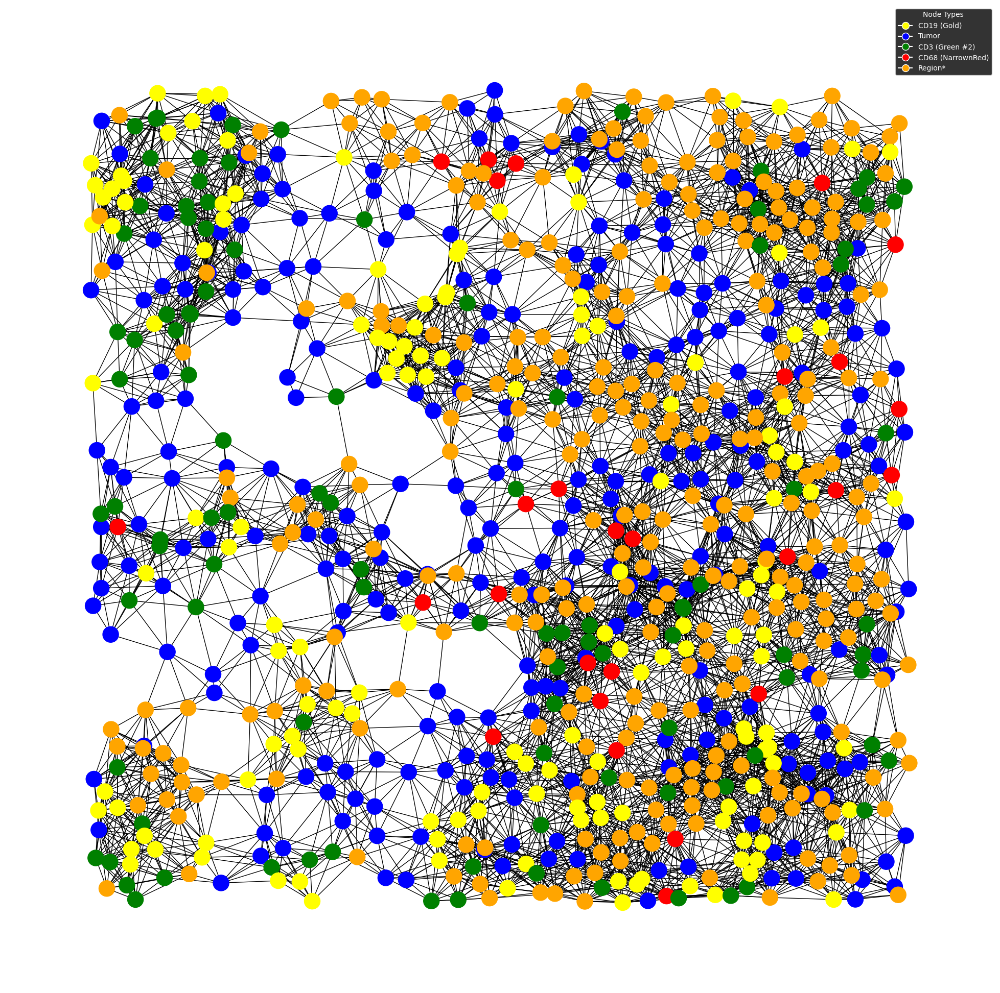

In [22]:
plt.figure(figsize=(25, 25))
legend_labels = {node_type: plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=node_type) # type: ignore
                 for node_type, color in node_colors.items()}

plt.legend(handles=legend_labels.values(), title='Node Types', loc='best')
nx.draw(G_high_tumor, pos, node_size=500, node_color=colors)
plt.show()

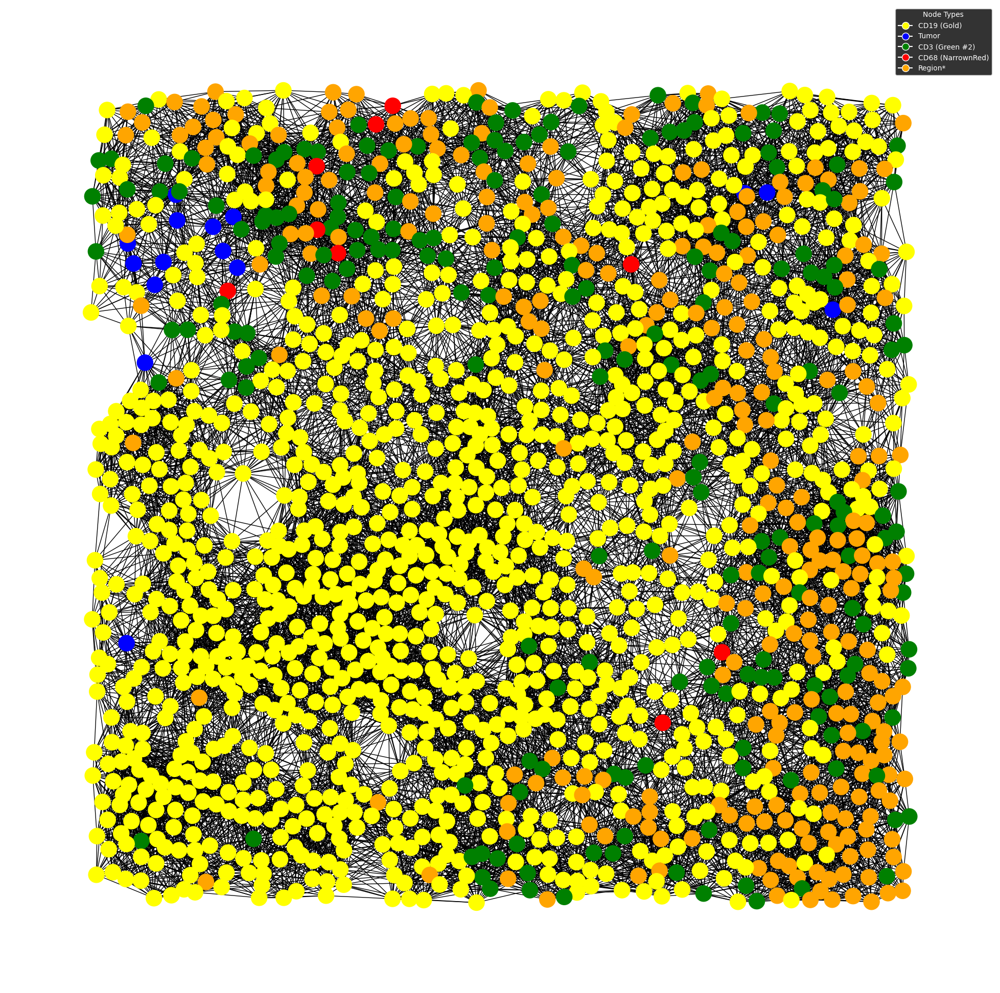

In [23]:
# Define colors for each node type
node_colors = {'CD19 (Gold)': 'yellow', 'Tumor': 'blue', 'CD3 (Green #2)': 'green', 'CD68 (NarrownRed)': 'red', 'Region*': 'orange'}

# Get node colors based on node type
colors = [node_colors[G_low_tumor.nodes[node]['type']] for node in G_low_tumor.nodes]

pos = nx.get_node_attributes(G_low_tumor, 'pos')

plt.figure(figsize=(25, 25))
plt.legend(handles=legend_labels.values(), title='Node Types', loc='best')
nx.draw(G_low_tumor, pos, node_size=500, node_color=colors)
plt.show()

Make an affinity matrix using only blue node and take first-degree neighbors type as columns

In [30]:
affinity_matrix_high_tumor = pd.DataFrame(columns=['node', 'CD19 (Gold)', 'Tumor', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*'])

In [31]:
blue_nodes = [node for node, data in G_high_tumor.nodes(data=True) if data.get('type') == 'Tumor']

for node in blue_nodes:
    neighbor_counts = {column: 0 for column in affinity_matrix_high_tumor.columns[1:]}
    neighbor_counts['node'] = node
    for neighbor in G_high_tumor.neighbors(node):
        type_node = G_high_tumor.nodes[neighbor]['type']
        neighbor_counts[type_node] += 1
    
    neighbor_counts_df = pd.DataFrame([neighbor_counts], columns=affinity_matrix_high_tumor.columns)
    affinity_matrix_high_tumor = pd.concat([affinity_matrix_high_tumor, neighbor_counts_df], ignore_index=True)

[X] Make box plots from the affinity matrix for each of the types to showcase distribution

[X] Make separate subplots with tumor nodes and each of its neighbors type

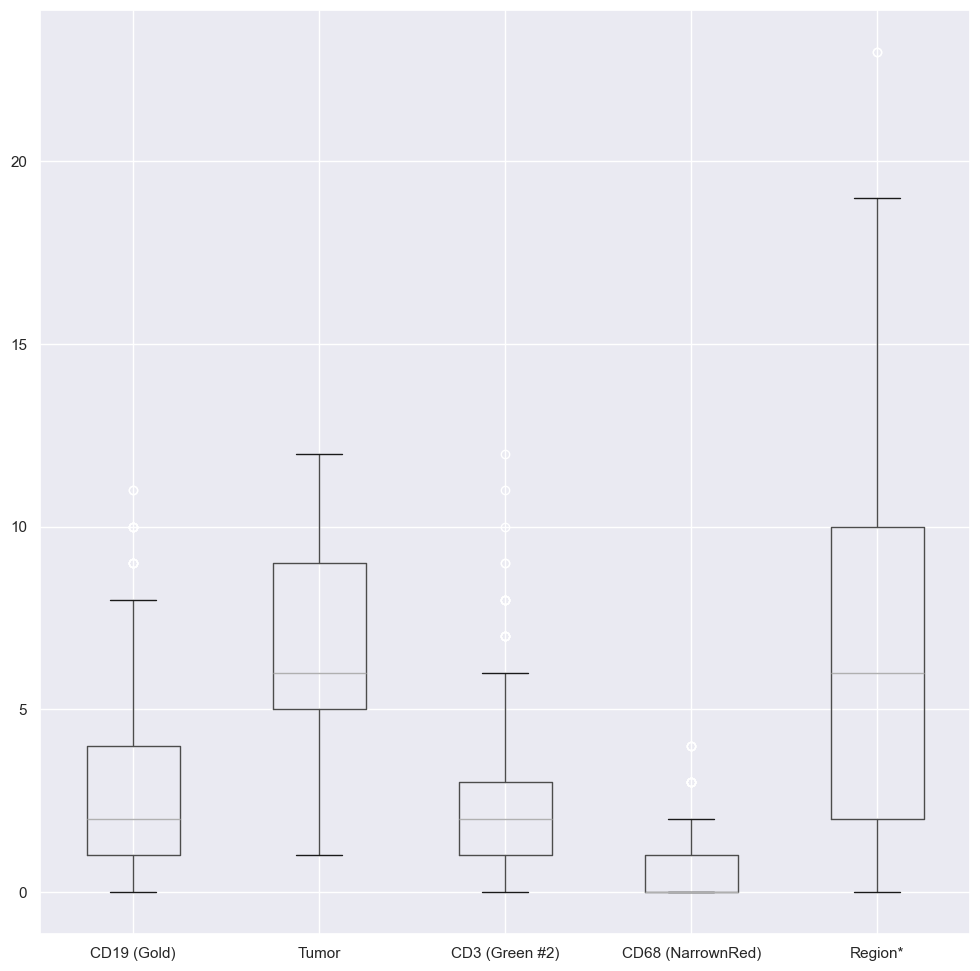

In [33]:
numeric_cols = affinity_matrix_high_tumor.columns.difference(['node'])
affinity_matrix_high_tumor[numeric_cols] = affinity_matrix_high_tumor[numeric_cols].apply(pd.to_numeric, errors='coerce')


plt.figure(figsize=(12, 12))
boxplot = affinity_matrix_high_tumor.drop('node', axis=1).boxplot(column=list(affinity_matrix_high_tumor.columns[1:]))
plt.show()

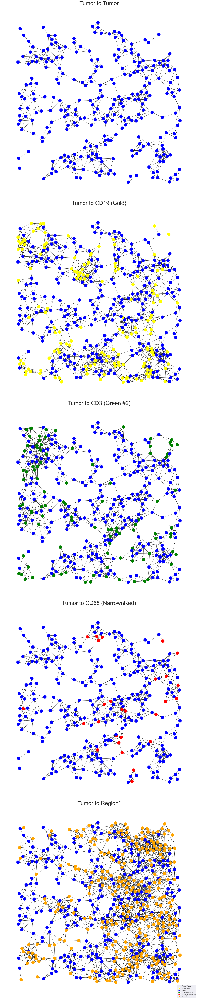

In [62]:
affinity_matrix_high_tumor.columns = ['node', 'Tumor', 'CD19 (Gold)', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*']

tumor_nodes = [node for node, data in G_high_tumor.nodes(data=True) if data.get('type') == 'Tumor']

fig, axs = plt.subplots(len(list(affinity_matrix_high_tumor.columns[1:])), 1, figsize=(20, len(list(affinity_matrix_high_tumor.columns[1:]))*20))

for i, subcomponent in enumerate(list(affinity_matrix_high_tumor.columns[1:])):
    tumor_neighbors = [neighbor for node in tumor_nodes for neighbor in G_high_tumor.neighbors(node) if G_high_tumor.nodes[neighbor]['type'] == subcomponent]
    tumor_graph = G_high_tumor.subgraph(tumor_nodes + tumor_neighbors)
    colors = [node_colors[tumor_graph.nodes[node]['type']] for node in tumor_graph.nodes]
    pos = nx.get_node_attributes(tumor_graph, 'pos')
    nx.draw(tumor_graph, pos, ax=axs[i],node_size=500, node_color=colors)
    axs[i].set_title(f'Tumor to {subcomponent}', fontsize=40)

plt.legend(handles=legend_labels.values(), title='Node Types', loc='lower right')
plt.tight_layout()
plt.show()

In [63]:
affinity_matrix_low_tumor = pd.DataFrame(columns=['node', 'CD19 (Gold)', 'Tumor', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*'])

blue_nodes = [node for node, data in G_low_tumor.nodes(data=True) if data.get('type') == 'Tumor']

for node in blue_nodes:
    neighbor_counts = {column: 0 for column in affinity_matrix_low_tumor.columns[1:]}
    neighbor_counts['node'] = node
    for neighbor in G_low_tumor.neighbors(node):
        type_node = G_low_tumor.nodes[neighbor]['type']
        neighbor_counts[type_node] += 1
    
    neighbor_counts_df = pd.DataFrame([neighbor_counts], columns=affinity_matrix_low_tumor.columns)
    affinity_matrix_low_tumor = pd.concat([affinity_matrix_low_tumor, neighbor_counts_df], ignore_index=True)

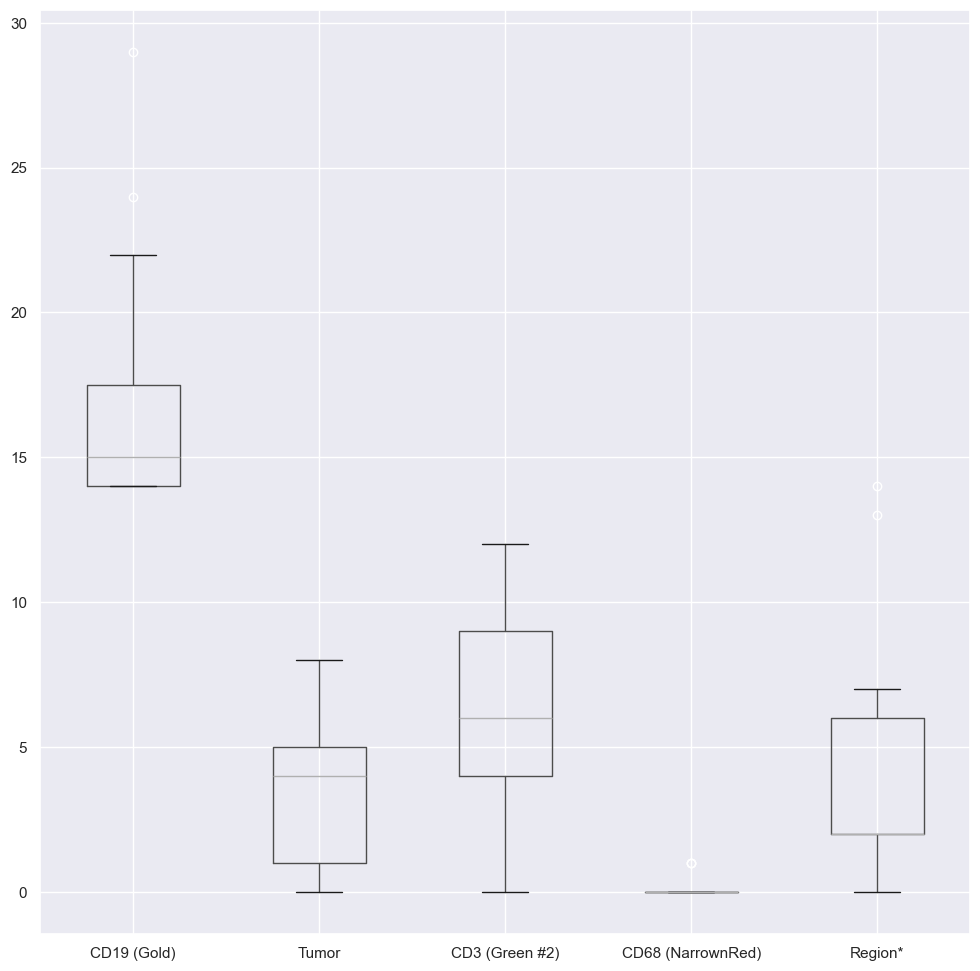

In [64]:
numeric_cols = affinity_matrix_low_tumor.columns.difference(['node'])
affinity_matrix_low_tumor[numeric_cols] = affinity_matrix_low_tumor[numeric_cols].apply(pd.to_numeric, errors='coerce')


plt.figure(figsize=(12, 12))
boxplot = affinity_matrix_low_tumor.drop('node', axis=1).boxplot(column=list(affinity_matrix_low_tumor.columns[1:]))
plt.show()

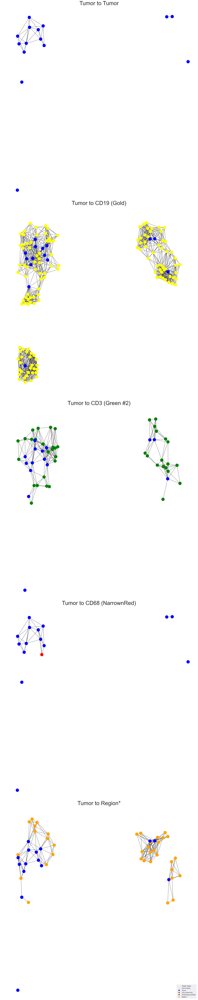

In [65]:
affinity_matrix_low_tumor.columns = ['node', 'Tumor', 'CD19 (Gold)', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*']

tumor_nodes = [node for node, data in G_low_tumor.nodes(data=True) if data.get('type') == 'Tumor']

fig, axs = plt.subplots(len(list(affinity_matrix_low_tumor.columns[1:])), 1, figsize=(20, len(list(affinity_matrix_low_tumor.columns[1:]))*20))

for i, subcomponent in enumerate(list(affinity_matrix_low_tumor.columns[1:])):
    tumor_neighbors = [neighbor for node in tumor_nodes for neighbor in G_low_tumor.neighbors(node) if G_low_tumor.nodes[neighbor]['type'] == subcomponent]
    tumor_graph = G_low_tumor.subgraph(tumor_nodes + tumor_neighbors)
    colors = [node_colors[tumor_graph.nodes[node]['type']] for node in tumor_graph.nodes]
    pos = nx.get_node_attributes(tumor_graph, 'pos')
    nx.draw(tumor_graph, pos, ax=axs[i],node_size=500, node_color=colors)
    axs[i].set_title(f'Tumor to {subcomponent}', fontsize=40)

plt.legend(handles=legend_labels.values(), title='Node Types', loc='lower right')
plt.tight_layout()
plt.show()

In [67]:
G = nx.Graph()

for idx, row in df_without_overlapping.iterrows():
    G.add_node(idx, pos=(row['Centroid X µm'], - row['Centroid Y µm']), type=row['Class'])

In [69]:
for (node1, row1), (node2, row2) in combinations(df_without_overlapping.iterrows(), 2):
    pos1 = (row1['Centroid X µm'], row1['Centroid Y µm'])
    pos2 = (row2['Centroid X µm'], row2['Centroid Y µm'])
    if euclidean_distance(pos1, pos2) < distance_threshold:
        G.add_edge(node1, node2)

In [71]:
nx.drawing.nx_pydot.write_dot(G, 'whole-network.dot')

In [ ]:
G = nx.Graph(nx.nx_pydot.read_dot('whole-network.dot'))

In [72]:
colors = [node_colors[G.nodes[node]['type']] for node in G.nodes]

pos = nx.get_node_attributes(G, 'pos')

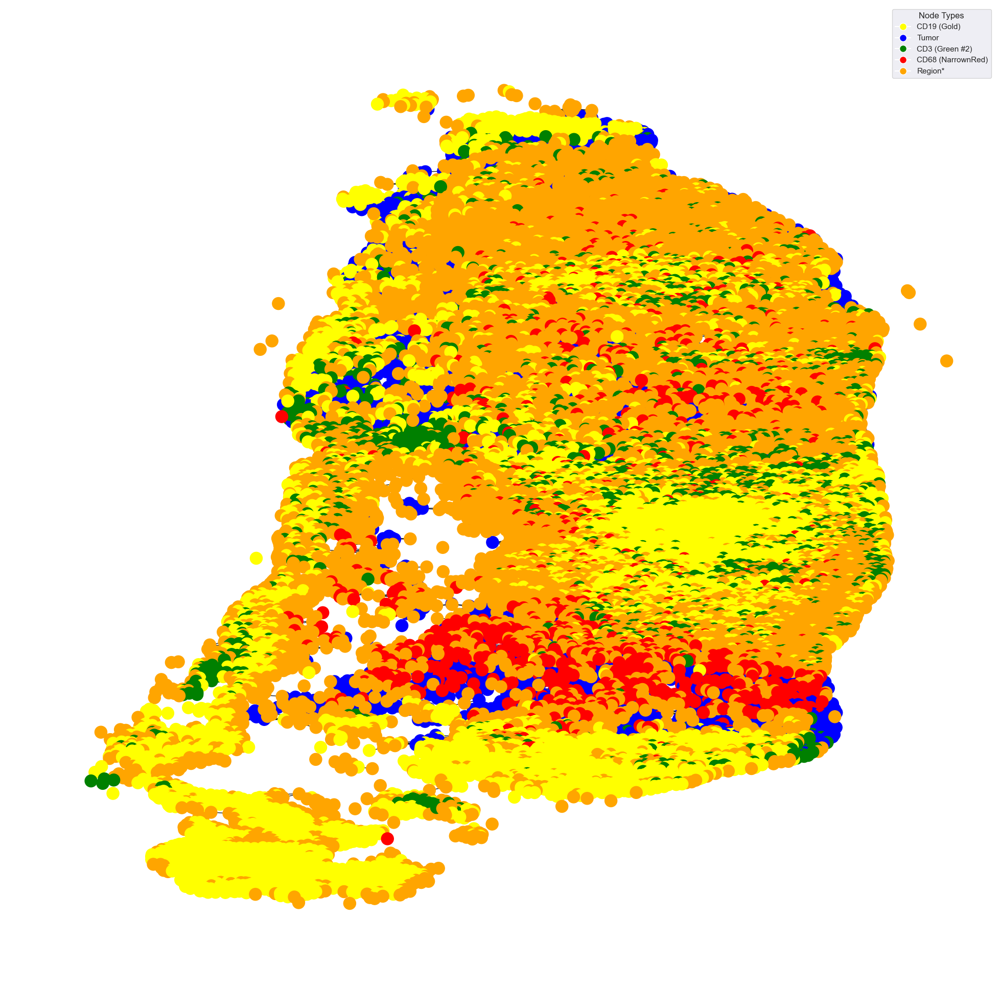

In [75]:
plt.figure(figsize=(25, 25))
plt.legend(handles=legend_labels.values(), title='Node Types', loc='best')
nx.draw(G, pos, node_size=300, node_color=colors)
plt.show()

In [76]:
affinity_matrix = pd.DataFrame(columns=['node', 'CD19 (Gold)', 'Tumor', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*'])

blue_nodes = [node for node, data in G.nodes(data=True) if data.get('type') == 'Tumor']

for node in blue_nodes:
    neighbor_counts = {column: 0 for column in affinity_matrix.columns[1:]}
    neighbor_counts['node'] = node
    for neighbor in G.neighbors(node):
        type_node = G.nodes[neighbor]['type']
        neighbor_counts[type_node] += 1
    
    neighbor_counts_df = pd.DataFrame([neighbor_counts], columns=affinity_matrix.columns)
    affinity_matrix = pd.concat([affinity_matrix, neighbor_counts_df], ignore_index=True)

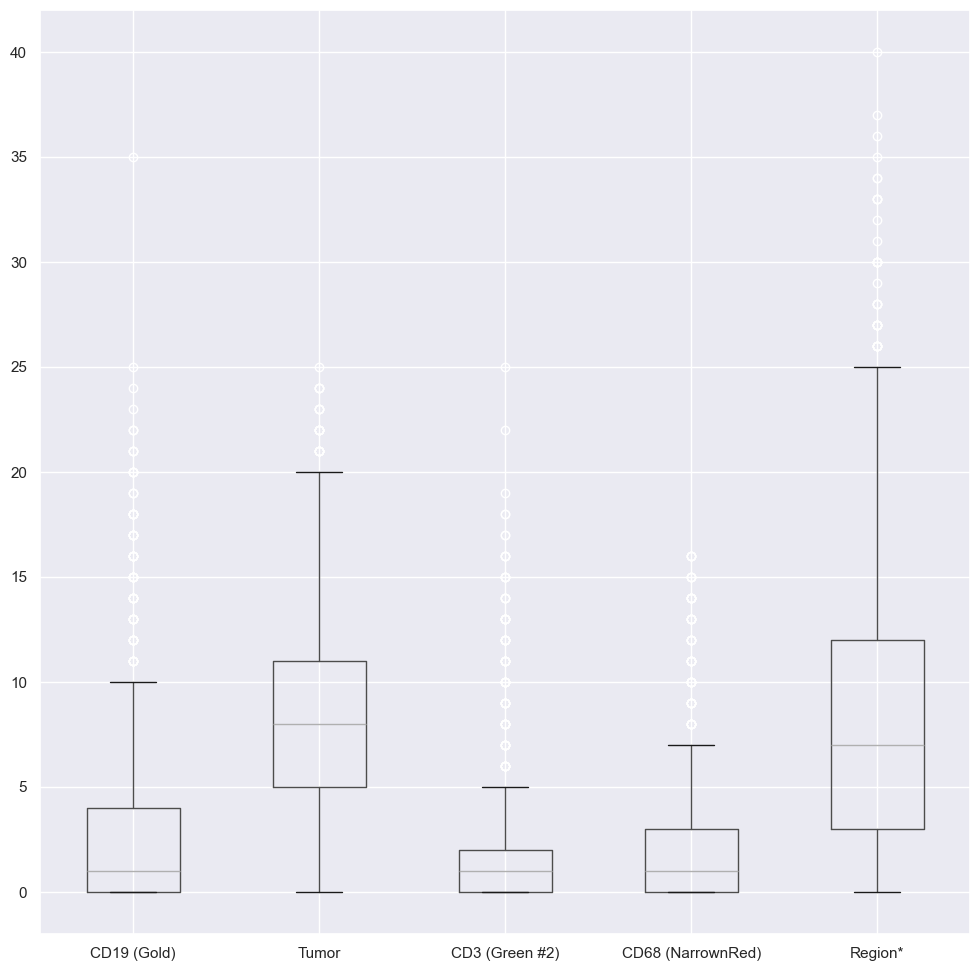

In [78]:
numeric_cols = affinity_matrix.columns.difference(['node'])
affinity_matrix[numeric_cols] = affinity_matrix[numeric_cols].apply(pd.to_numeric, errors='coerce')

plt.figure(figsize=(12, 12))
boxplot = affinity_matrix.drop('node', axis=1).boxplot(column=list(affinity_matrix.columns[1:]))
plt.show()

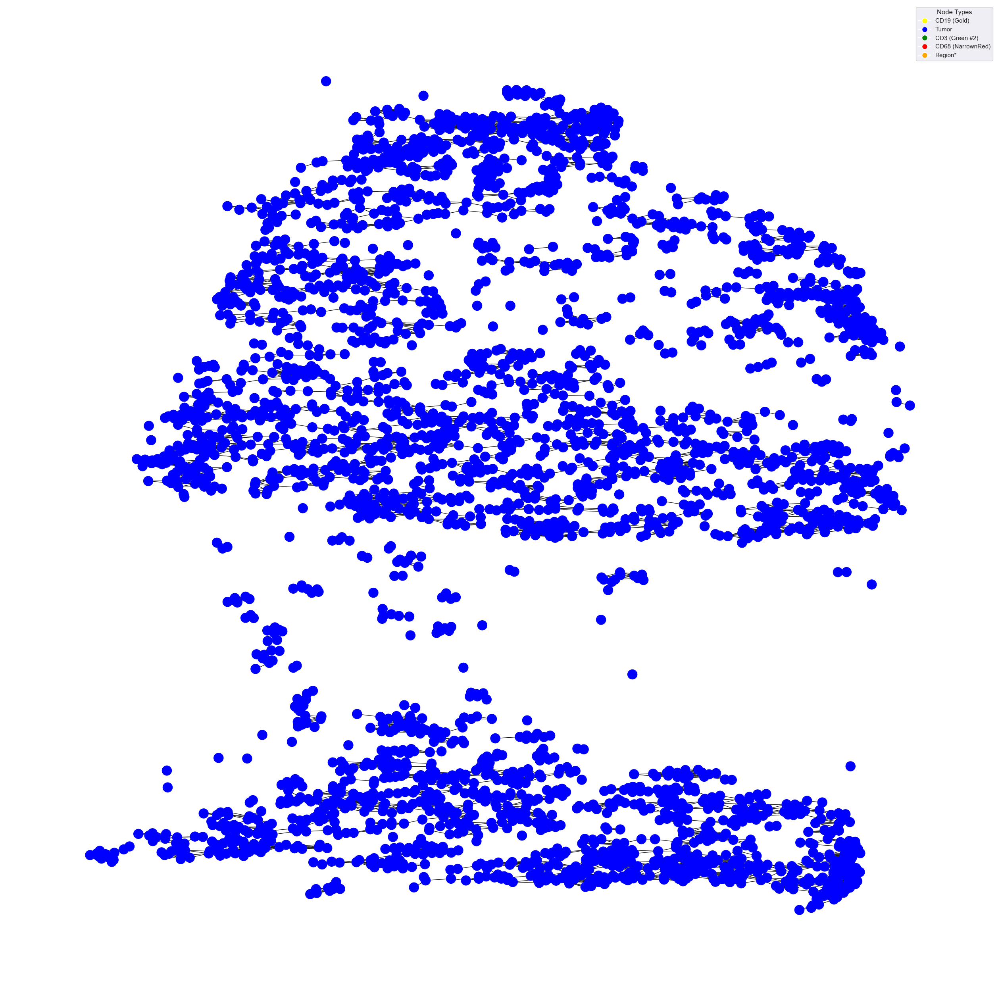

In [85]:
affinity_matrix.columns = ['node', 'Tumor', 'CD19 (Gold)', 'CD3 (Green #2)', 'CD68 (NarrownRed)', 'Region*']


tumor_nodes = [node for node, data in G.nodes(data=True) if data.get('type') == 'Tumor']
tumor_graph = G.subgraph(tumor_nodes)

plt.figure(figsize=(25, 25))

colors = [node_colors[tumor_graph.nodes[node]['type']] for node in tumor_graph.nodes]
pos = nx.get_node_attributes(tumor_graph, 'pos')
nx.draw(tumor_graph, pos, node_size=300, node_color=colors)


plt.legend(handles=legend_labels.values(), title='Node Types', loc='best')
plt.show()